In [1]:
import pandas as pd
import numpy as np
from ast import literal_eval
from nltk import word_tokenize
from collections import defaultdict
from FightingWords.fighting_words_py3 import bayes_compare_language
from FightingWords.fighting_words_py3 import basic_sanitize
from matplotlib import pyplot as plt 
from adjustText import adjust_text
from tqdm import tqdm
import spacy
nlp=spacy.load('en_core_web_sm')

/Users/mstudio/miniconda3/envs/py3.10/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
path='/Users/mstudio/Library/CloudStorage/Box-Box/coolie/token/'
df=pd.read_csv(path+'coolie-token-lemma.csv', converters={'state':literal_eval, 'sent':literal_eval, 'city':literal_eval, 'lemma':literal_eval})

In [3]:
df['lemma_str']=df['lemma'].apply(lambda x: ' '.join(x))

In [4]:
df['lemma_str']=df['lemma_str'].astype(str)

In [5]:
df['state_str']=df['state'].str[0]

In [6]:
descriptive=df.groupby('state_str').size().reset_index(name='count').sort_values(by='count', ascending=False)
# descriptive['count'].sum()
descriptive

,state_str,count
8,District of Columbia,11302
11,Hawaii,8613
31,New York,7671
4,California,6814
23,Minnesota,3966
13,Illinois,3619
27,Nebraska,3165
6,Connecticut,3132
34,Ohio,3102
44,Utah,3030


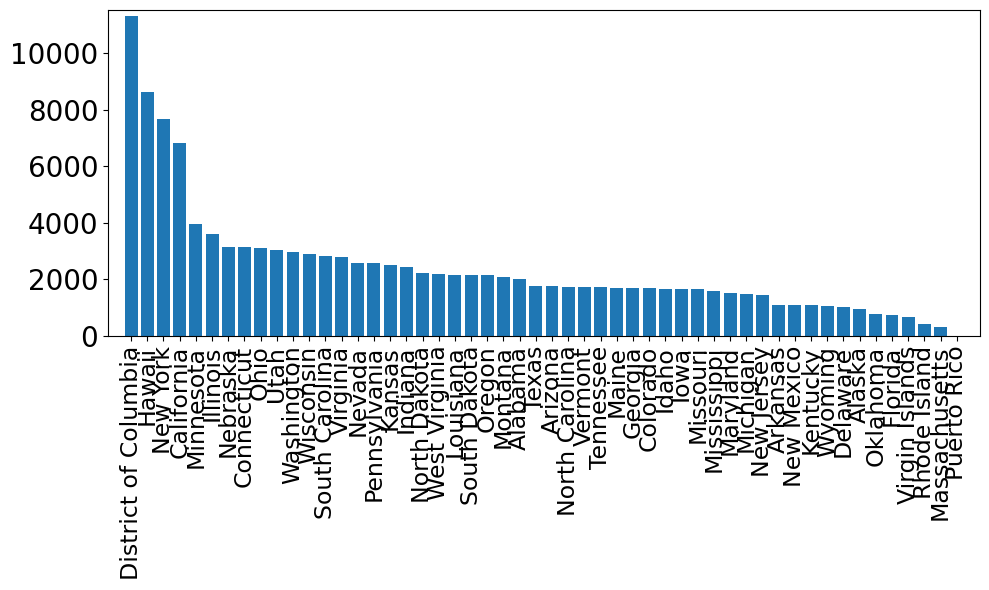

In [7]:
# Create a bar plot
plt.figure(figsize=(10, 6))  # Optional: Adjust the figure size
plt.margins(0.02)
plt.bar(descriptive['state_str'], descriptive['count'])
# plt.xlabel('State')
# plt.ylabel('Count')
# plt.title('State Counts')

# Display the plot
plt.xticks(rotation=90, fontsize=17)
plt.yticks(fontsize=20)
  # Optional: Rotate state names for better visibility
plt.tight_layout()  # Optional: Ensure the labels fit within the figure
plt.savefig('eacl2023_latex/figure/'+'descriptive.pdf', dpi=200, bbox_inches='tight')
plt.show()



In [6]:
slave_states=['Virginia',
              'Tennessee','Arkansas','Florida',
              'Alabama','Louisiana','North Carolina',
              'South Carolina','Mississippi',
              'Texas','Georgia',
              'Missouri', 'Kentucky', 'Maryland', 'West Virginia', 'Delaware']

In [7]:
free_states=['Maine', 'New York', 'New Hampshire', 'Vermont',
              'Massachusetts', 'Connecticut', 'Rhode Island',
              'Pennsylvania', 'New Jersey', 'Ohio',
              'Indiana', 'Illinois', 'Kansas',
                'Michigan', 'Wisconsin', 'Minnesota',
                'Iowa'
               ]

In [8]:
confederate=df[df['state_str'].isin(slave_states)]
union=df[df['state_str'].isin(free_states)]

In [10]:
print(confederate.shape, union.shape)

(27703, 9) (40647, 9)


In [11]:
language=bayes_compare_language(union['lemma_str'], confederate['lemma_str'])

Vocab size is 6508
Comparing language...


In [12]:
language_z_df=pd.DataFrame(language, columns=['token', 'z-score'])

In [13]:
language_z_df_outlier=pd.DataFrame(language, columns=['token', 'z-score'])

In [14]:
df[df['lemma_str'].str.contains('health')].groupby(by='state_str').count().sort_values(by='lemma_str', ascending=False)[:5]

,state,city,date,lccn,sent,title,lemma,lemma_str
state_str,,,,,,,,
New York,26,26,26,26,26,26,26,26
Hawaii,16,16,16,16,16,16,16,16
District of Columbia,14,14,14,14,14,14,14,14
Oregon,7,7,7,7,7,7,7,7
California,6,6,6,6,6,6,6,6


In [15]:
df[df['lemma_str'].str.contains('revival')].groupby(by='state_str').count().sort_values(by='lemma_str', ascending=False)[:5]

,state,city,date,lccn,sent,title,lemma,lemma_str
state_str,,,,,,,,
Illinois,61,61,61,61,61,61,61,61
Louisiana,17,17,17,17,17,17,17,17
Arkansas,15,15,15,15,15,15,15,15
West Virginia,13,13,13,13,13,13,13,13
Tennessee,13,13,13,13,13,13,13,13


In [16]:
df[(df['state_str']=='Illinois')&(df['lemma_str'].str.contains('revival'))]

,state,city,date,lccn,sent,title,lemma,lemma_str,state_str
22273,[Illinois],[Chicago],18760701,sn84031492,"[liberty, loving, german, ,, and, tolerates, a...",Chicago daily tribune. [volume],"[liberty, love, german, tolerate, revival, tho...",liberty love german tolerate revival tho cooli...,Illinois
24938,[Illinois],[Cairo],18690710,sn88074143,"[birth, of, slavery, ., '', meauing, tho, revi...",The Cairo evening bulletin.,"[birth, slavery, meaue, tho, revival, coolie, ...",birth slavery meaue tho revival coolie trade t...,Illinois
51405,[Illinois],[Rock Island],18760628,sn92053942,"[the, liberty-loving, german, and, toler, ates...",The daily Argus.,"[german, toler, ates, revival, coolie, trade, ...",german toler ates revival coolie trade mon gol...,Illinois
52802,"[Illinois, Michigan, Ohio, Pennsylvania]","[Chicago, Detroit, Cincinnati, Philadelphia]",18690904,sn89077510,"[attempta, of, unprincipled, and, interested, ...",The workingman's advocate. [volume],"[attempta, unprinciple, interested, party, rev...",attempta unprinciple interested party revive i...,Illinois
62125,[Illinois],[Cairo],18761017,sn85033413,"[discards, the, liberty-lovintt, oettnan, and,...",The Cairo bulletin. [volume],"[discards, oettnan, tolerate, revival, tae, co...",discards oettnan tolerate revival tae coolie t...,Illinois
...,...,...,...,...,...,...,...,...,...
121232,[Illinois],[Cairo],18761013,sn85033413,"[discard, lhe, lihertt-lomng, iermn, nd, toler...",The Cairo bulletin. [volume],"[discard, lhe, iermn, nd, tolerates, revival, ...",discard lhe iermn nd tolerates revival coolie ...,Illinois
121233,[Illinois],[Cairo],18760818,sn85033413,"[discard, the, liberty-loving, gertnsn, and, t...",The Cairo bulletin. [volume],"[discard, gertnsn, tolerate, revival, coolie, ...",discard gertnsn tolerate revival coolie trad m...,Illinois
121234,[Illinois],[Cairo],18760923,sn85033413,"[the, liberty-loviog, (, lernian, and, tolerat...",The Cairo bulletin. [volume],"[lernian, tolerate, revival, coolie, trade, mo...",lernian tolerate revival coolie trade mongolia...,Illinois
121235,[Illinois],[Cairo],18760927,sn85033413,"[discards, the, liberty-loving, gorman, and, t...",The Cairo bulletin. [volume],"[discards, gorman, tolerate, revival, coolie, ...",discards gorman tolerate revival coolie trad m...,Illinois


In [17]:
df[(df['state_str']=='Arkansas')&(df['lemma_str'].str.contains('revival'))]

,state,city,date,lccn,sent,title,lemma,lemma_str,state_str
10589,[Arkansas],[Russellville],18760720,sn84023017,"[liberty, loving, german, and, ;, tolerates, t...",The Russellville Democrat. [volume],"[liberty, love, german, tolerate, revival, coo...",liberty love german tolerate revival coolie tr...,Arkansas
10590,[Arkansas],[Russellville],18760831,sn84023017,"[liberty-loving, german, and, !, tolerat, s, t...",The Russellville Democrat. [volume],"[german, tolerat, revival, coolie, trade, mong...",german tolerat revival coolie trade mongolian ...,Arkansas
95530,[Arkansas],[Russellville],18761019,sn84023017,"[liberty, loving, german, and, j, tolerates, t...",The Russellville Democrat. [volume],"[liberty, love, german, j, tolerate, revival, ...",liberty love german j tolerate revival coolie ...,Arkansas
95531,[Arkansas],[Russellville],18761026,sn84023017,"[discards, the, liberty-loving, german, and, t...",The Russellville Democrat. [volume],"[discard, german, tolerate, revival, coolie, t...",discard german tolerate revival coolie trade m...,Arkansas
100481,[Arkansas],[Russellville],18760824,sn84023017,"[tin.-, liberty, loving, german, and, tolerate...",The Russellville Democrat. [volume],"[liberty, love, german, tolerate, revival, coo...",liberty love german tolerate revival coolie tr...,Arkansas
103483,[Arkansas],[Russellville],18760810,sn84023017,"[discards, the, liberty-loving, german, and, t...",The Russellville Democrat. [volume],"[discard, german, tolerate, revival, coolie, t...",discard german tolerate revival coolie trade m...,Arkansas
103485,[Arkansas],[Russellville],18760817,sn84023017,"[the, liberty, hiving, german, and, tolerates,...",The Russellville Democrat. [volume],"[liberty, hive, german, tolerate, revival, coo...",liberty hive german tolerate revival coolie tr...,Arkansas
103487,[Arkansas],[Russellville],18760907,sn84023017,"[the, liberty, loving, german, and, tolerates,...",The Russellville Democrat. [volume],"[liberty, love, german, tolerate, revival, coo...",liberty love german tolerate revival coolie tr...,Arkansas
103488,[Arkansas],[Russellville],18760914,sn84023017,"[discards, the, liberty-loving, german, and, t...",The Russellville Democrat. [volume],"[discard, german, tolerate, revival, coolie, t...",discard german tolerate revival coolie trade m...,Arkansas
103489,[Arkansas],[Russellville],18761005,sn84023017,"[discards, the, liberty-loving, german, and, t...",The Russellville Democrat. [volume],"[discard, german, tolerate, revival, coolie, t...",discard german tolerate revival coolie trade m...,Arkansas


In [18]:
df[(df['state_str']=='Arkansas')&(df['lemma_str'].str.contains('revival'))].loc[10589, 'lemma']

['liberty',
 'love',
 'german',
 'tolerate',
 'revival',
 'coolie',
 'trade',
 'mongolian',
 'woman',
 'iin']

In [19]:
df[(df['state_str']=='Illinois')&(df['lemma_str'].str.contains('revival'))].loc[22273, 'lemma']

['liberty',
 'love',
 'german',
 'tolerate',
 'revival',
 'tho',
 'coolie',
 'trade',
 'mongolian',
 'woman',
 'import',
 'immoral',
 'purpose']

In [20]:
language_z_df

,token,z-score
0,hitch,-8.662624
1,france,-8.156768
2,jockey,-8.152919
3,design,-7.967254
4,thc,-7.907721
...,...,...
6503,coats,6.892395
6504,cigar,7.139537
6505,servile,8.237297
6506,oppose,9.986140


In [21]:
language_z_df[language_z_df['token']=='korean']

,token,z-score
4274,korean,0.585667


In [23]:
language_z_df.to_csv(path + 'z-score-free-slave.csv', index=False)

In [24]:
len([item for sublist in df['lemma'] for item in sublist])

1291651

In [25]:
frequency_language=defaultdict(int)
for word in tqdm([item for sublist in df['lemma'] for item in sublist]):
    if word in language_z_df['token'].values:
        frequency_language[word]+=1

100%|██████████| 1291651/1291651 [01:18<00:00, 16399.61it/s]


In [26]:
frequency_list=[]
for word in frequency_language.keys():
    frequency_list.append([word, frequency_language[word]])
lang_freq_df=pd.DataFrame(frequency_list, columns=['token', 'frequency'])

In [27]:
lang_freq_df.to_csv(path + 'free-slave-frequency.csv', index=False)

In [28]:
viz_df=pd.merge(lang_freq_df, language_z_df, on='token').sort_values(by=['z-score'], ascending=False)
viz_df['freq_ratio']=viz_df['frequency']/viz_df['frequency'].sum()

In [29]:
viz_df.to_csv(path + 'free-slave-viz.csv', index=False)

In [30]:
viz_df.columns

Index(['token', 'frequency', 'z-score', 'freq_ratio'], dtype='object')

In [31]:
viz_df['freq_ratio'].quantile([0.25, 0.5, 0.75])

0.25    0.000027
0.50    0.000051
0.75    0.000123
Name: freq_ratio, dtype: float64

Visualization

In [32]:
path='/Users/mstudio/Library/CloudStorage/Box-Box/coolie/token/'
viz_df=pd.read_csv(path+'free-slave-viz.csv')

In [33]:
viz_df[viz_df['token']=='indian']

,token,frequency,z-score,freq_ratio
3805,indian,1677,-0.23259,0.001773


In [41]:
color_mapping = {
    'african': 'red',
    # 'africa':'red',
    'negro': 'red',
    'nigger': 'red',
    'slave': 'red',
    'revival': 'red',
    'chinese': 'red',
    # 'china': 'red',
    # 'japan': 'red',
    'japanese': 'red',
    'labor': 'red',
    # 'laborer': 'red',
    # 'immoral':'red',
    # 'demoralize':'red',
    # 'morally':'red',
    # 'moral':'red',
    # 'morality':'red',
    'worker': 'red',
    'wage': 'red',
    'want': 'red',
    'work': 'red',
    'workman': 'red',
    'cheap': 'red',
    'trade': 'red',
    'ship': 'red',
    'import': 'red',
    # 'mongolian': 'red',
    'cotton': 'red',
    # 'indian': 'red',
    'asian': 'red',
    'plantation': 'red',
    'immigration': 'red',
    'oppose': 'red',
    'pay': 'red',
    'railroad':'red',
    'rail':'red',
    # 'train': 'red'
    # 'sugar':
}
viz_df['color'] = viz_df['token'].map(color_mapping).fillna('skyblue')


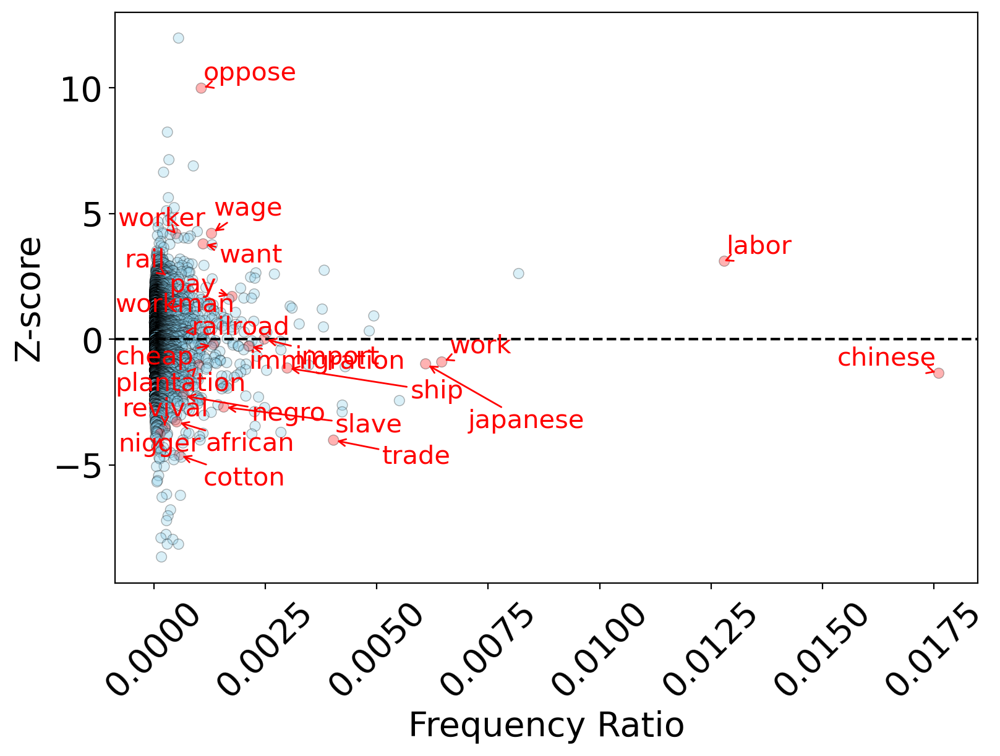

In [42]:
fig, ax = plt.subplots(figsize=(9, 6), dpi=200)
scatter = plt.scatter(y=viz_df['z-score'], x=viz_df['freq_ratio'], 
           alpha=0.3, color=viz_df['color'],
           marker='o', edgecolors='black', linewidths=0.5)
ax.axhline(y=0.0005, color='black', linestyle='--')

# List of tokens to annotate and their corresponding colors
tokens_to_annotate = color_mapping

annotations = []
for idx, row in viz_df.iterrows():
    token = row['token']
    if token in tokens_to_annotate:
        color = tokens_to_annotate[token]
        annotation = ax.annotate(token, (row['freq_ratio'], row['z-score']), color=color, fontsize=15)
        annotations.append(annotation)

# Use adjust_text to prevent label overlap
adjust_text(annotations, arrowprops=dict(arrowstyle='->', color='red'))

plt.xticks(rotation=45)
ax.tick_params(axis='both', which='both', labelsize=20)  # Increase tick label font size

plt.xlabel('Frequency Ratio', fontsize=20)
plt.ylabel('Z-score', fontsize=20)


# Save the plot to a file (e.g., PDF)
plt.savefig('z-score-token-free-slave.pdf', bbox_inches='tight', dpi=200)

plt.show()


Embedding space

In [9]:
from top2vec import Top2Vec
import umap
import plotly.express as px

/Users/mstudio/miniconda3/envs/py3.10/lib/python3.10/site-packages/umap/distances.py:1063: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/mstudio/miniconda3/envs/py3.10/lib/python3.10/site-packages/umap/distances.py:1071: NumbaDeprecationWarning: The 'nopython' keyword argument was not supplied to the 'numba.jit' decorator. The implicit default value for this argument is currently False, but it will be changed to True in Numba 0.59.0. See https://numba.readthedocs.io/en/stable/reference/deprecation.html#deprecation-of-object-mode-fall-back-behaviour-when-using-jit for details.
  @numba.jit()
/Users/mstudio/miniconda3/envs/py3.10/lib/python3.10/site-packag

In [13]:
model=Top2Vec(documents=df['lemma_str'].tolist(), speed='learn', workers=4)

2024-04-24 15:38:35,462 - top2vec - INFO - Pre-processing documents for training


2024-04-24 15:38:37,357 - top2vec - INFO - Creating joint document/word embedding
2024-04-24 15:40:17,744 - top2vec - INFO - Creating lower dimension embedding of documents
2024-04-24 15:40:43,371 - top2vec - INFO - Finding dense areas of documents
2024-04-24 15:40:46,405 - top2vec - INFO - Finding topics


In [14]:
df['vector']=model.document_vectors.tolist()

In [15]:
embedding = umap.UMAP().fit_transform(df['vector'].tolist())

In [113]:
western_slave_embedding = umap.UMAP().fit_transform(western_slave['vector'].tolist())

In [16]:
clusterable_embedding = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=2,
    random_state=42,
).fit_transform(embedding.data)

In [114]:
clusterable_embedding_western_slave = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=2,
    random_state=42,
).fit_transform(western_slave_embedding.data)

In [104]:
color_category={
'Virginia': 'slave',
'Tennessee': 'slave',
'Arkansas': 'slave',
'Florida': 'slave',
'Alabama': 'slave',
'Louisiana': 'slave',
'North Carolina': 'slave',
'South Carolina': 'slave',
'Mississippi': 'slave',
'Texas': 'slave',
'Georgia': 'slave',
'Missouri': 'slave',
'Kentucky': 'slave',
'Maryland': 'slave',
'West Virginia': 'slave',
'Delaware': 'slave',
'Maine': 'free',
'New York': 'free',
'New Hampshire': 'free',
'Vermont': 'free',
'Massachusetts': 'free',
'Connecticut': 'free',
'Rhode Island': 'free',
'Pennsylvania': 'free',
'New Jersey': 'free',
'Ohio': 'free',
'Indiana': 'free',
'Illinois': 'free',
'Kansas': 'free',
'Michigan': 'free',
'Wisconsin': 'free',
'Minnesota': 'free',
'Iowa': 'free',
'California': 'western',
'Oregon': 'western',
'Washington': 'western',
'Nevada': 'western',
'Utah': 'western',
'Colorado': 'western',
'Wyoming': 'western',
'Idaho': 'western',
'Montana': 'western',
'North Dakota': 'western',
'South Dakota': 'western',
'Nebraska': 'western',
'Arizona': 'western',
'New Mexico': 'western',
'Oklahoma': 'western'
}

In [106]:
df['color']=df['state_str'].map(color_category)

In [107]:
df.dropna(subset=['color'], inplace=True)

In [108]:
df

,state,city,date,lccn,sent,title,lemma,lemma_str,state_str,vector,color
0,[New York],[New York],18910826,sn83030193,"[., cholera, breaks, out, on, a, steamer, lade...",The evening world. [volume],"[cholera, break, steamer, laden, ohinoso, cool...",cholera break steamer laden ohinoso coolie ur ...,New York,"[-0.09219261258840561, 0.09139633178710938, -0...",free
1,[New York],[New York],18910826,sn83030193,"[tho, steamer, namchow, sailed, from, that, po...",The evening world. [volume],"[tho, steamer, namchow, sail, port, chinese, c...",tho steamer namchow sail port chinese coolie t...,New York,"[-0.10301278531551361, 0.11093282699584961, -0...",free
2,[Montana],[Butte],18830407,sn84036033,"[that, the, authorities, of, kalakaua, 's, kin...",The semi-weekly miner. [volume],"[authority, kalakaua, kingdom, welcome, chines...",authority kalakaua kingdom welcome chinese coo...,Montana,"[0.09256662428379059, 0.009675117209553719, -0...",western
3,[Montana],[Butte],18830407,sn84036033,"[believed, there, is, imminent, danger, of, ly...",The semi-weekly miner. [volume],"[believe, imminent, danger, lynch, kanakas, wa...",believe imminent danger lynch kanakas want coo...,Montana,"[0.08338635414838791, -0.006830261554569006, 0...",western
4,[Montana],[Butte],18851114,sn84036033,"[papers, as, the, decedent, may, have, ., stan...",The semi-weekly miner. [volume],"[paper, decedent, may, stand, coolie, london, ...",paper decedent may stand coolie london novembe...,Montana,"[-0.019768569618463516, 0.0034308694303035736,...",western
...,...,...,...,...,...,...,...,...,...,...,...
125246,[Maryland],[Upper Marlboro],19000803,sn89060124,"[out, of, it, by, the, countn, capturing, a, l...",The Prince George's enquirer and southern Mary...,"[countn, capturing, lot, coolie, yellow, man, ...",countn capturing lot coolie yellow man labor m...,Maryland,"[-0.07490584999322891, -0.03109232895076275, -...",slave
125247,[New York],[New York],19110603,sn83030272,"[in, tho, general, store, who, sells, trash, t...",The sun. [volume],"[tho, general, store, sell, trash, chink, tin,...",tho general store sell trash chink tin coolie ...,New York,"[-0.07816760987043381, 0.01576632261276245, -0...",free
125248,[Maryland],[Thurmont],19200108,sn84026688,"[hie, harm, it, is, claimed, to, work, upon, (...",Catoctin clarion. [volume],"[hie, harm, claim, work, upon, coolie, distanc...",hie harm claim work upon coolie distance groat...,Maryland,"[-0.02738708071410656, -0.045340463519096375, ...",slave
125249,[New York],[New York],19111029,sn83030272,"[j, tions, ., ,, guid, ., with, porters, and, ...",The sun. [volume],"[j, tion, guid, porter, eighty, coolie, mrs, w...",j tion guid porter eighty coolie mrs williamso...,New York,"[-0.17490456998348236, 0.058804951608181, -0.0...",free


In [80]:
slave_states=['Virginia',
              'Tennessee','Arkansas','Florida',
              'Alabama','Louisiana','North Carolina',
              'South Carolina','Mississippi',
              'Texas','Georgia',
              'Missouri', 'Kentucky', 'Maryland', 'West Virginia', 'Delaware']
#16

In [ ]:
free_states=['Maine', 'New York', 'New Hampshire', 'Vermont',
              'Massachusetts', 'Connecticut', 'Rhode Island',
              'Pennsylvania', 'New Jersey', 'Ohio',
              'Indiana', 'Illinois', 'Kansas',
                'Michigan', 'Wisconsin', 'Minnesota',
                'Iowa'
               ]
#17

In [ ]:
western=['California', 'Oregon', 'Washington', 'Nevada', 'Utah', 'Colorado', 'Wyoming', 'Idaho', 'Montana', 'North Dakota', 'South Dakota', 'Nebraska', 'Arizona', 'New Mexico', 'Oklahoma']
#15

In [111]:
western_slave=df[(df['color']=='western')|(df['color']=='slave')]

In [36]:
len(df[df['state_str']=='Illinois']['vector'].iloc[0])

300

In [12]:
np.mean([[1,2,3], [4,5,6]], axis=0)

array([2.5, 3.5, 4.5])

In [37]:
state_avg={}
for state in df['state_str'].unique():
    state_avg[state]=np.mean(df[df['state_str']==state]['vector'].tolist(), axis=0)

/Users/mstudio/miniconda3/envs/py3.10/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3432: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/Users/mstudio/miniconda3/envs/py3.10/lib/python3.10/site-packages/numpy/core/_methods.py:190: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)


In [40]:
state_avg

{'New York': array([-1.54019348e-02,  2.33686487e-03,  8.37375425e-03,  6.89811984e-03,
         6.45735372e-03, -8.81922891e-03, -8.22798876e-03,  1.69622612e-02,
        -4.73659803e-03, -1.45673052e-02, -1.72005777e-02, -8.24023114e-03,
         1.40915563e-03,  1.74008869e-03, -1.64056852e-02, -6.36976446e-04,
        -1.02148076e-02, -5.92006355e-03,  1.30373411e-02, -7.52495927e-03,
        -2.17837044e-02,  5.30894294e-03,  1.01571947e-02,  2.51413771e-03,
         3.79962651e-02,  7.05802217e-03, -3.57536823e-03, -5.02351605e-03,
        -4.45528699e-03,  7.66684614e-03,  1.08394050e-02, -8.60522724e-03,
        -1.12619851e-02, -1.37824844e-02, -1.37010799e-02,  1.67802437e-02,
         1.14148983e-02, -6.45997893e-03,  1.08604004e-02, -1.26471247e-03,
        -7.72920500e-03, -6.22066927e-03,  2.68631601e-03, -7.63400697e-03,
         1.27624481e-02,  9.06867688e-03,  3.27037987e-03,  5.64942463e-03,
        -2.22266363e-02,  4.66721793e-03, -4.25083762e-03, -2.55722931e-03,


In [49]:
state_avg_df=pd.DataFrame(state_avg).T

In [50]:
state_avg_df['embedding']=list(state_avg_df.values)

In [52]:
state_avg_df=state_avg_df['embedding'].reset_index()

In [54]:
state_avg_df.dropna(subset=['index'], inplace=True)

In [70]:
state_avg_df=state_avg_df[~state_avg_df['index'].isin(['Virgin Islands', 'Puerto Rico', 'District of Columbia', 'Alaska', 'Hawaii'])]

In [71]:
embedding = umap.UMAP().fit_transform(state_avg_df['embedding'].tolist())

In [72]:
clusterable_embedding_avg = umap.UMAP(
    n_neighbors=30,
    min_dist=0.0,
    n_components=2,
    random_state=42,
).fit_transform(embedding.data)

In [77]:
fig = px.scatter(
    state_avg_df, 
    x=clusterable_embedding_avg[:, 0], 
    y=clusterable_embedding_avg[:, 1], 
    color=state_avg_df['index'],
    color_discrete_map={
        'Virginia': 'crimson',
'Tennessee': 'crimson',
'Arkansas': 'crimson',
'Florida': 'crimson',
'Alabama': 'crimson',
'Louisiana': 'crimson',
'North Carolina': 'crimson',
'South Carolina': 'crimson',
'Mississippi': 'crimson',
'Texas': 'crimson',
'Georgia': 'crimson',
'Missouri': 'crimson',
'Kentucky': 'crimson',
'Maryland': 'crimson',
'West Virginia': 'crimson',
'Delaware': 'crimson',
'Maine': 'blue',
'New York': 'blue',
'New Hampshire': 'blue',
'Vermont': 'blue',
'Massachusetts': 'blue',
'Connecticut': 'blue',
'Rhode Island': 'blue',
'Pennsylvania': 'blue',
'New Jersey': 'blue',
'Ohio': 'blue',
'Indiana': 'blue',
'Illinois': 'blue',
'Kansas': 'blue',
'Michigan': 'blue',
'Wisconsin': 'blue',
'Minnesota': 'blue',
'Iowa': 'blue',
'California': 'green',
'Oregon': 'green',
'Washington': 'green',
'Nevada': 'green',
'Utah': 'green',
'Colorado': 'green',
'Wyoming': 'green',
'Idaho': 'green',
'Montana': 'green',
'North Dakota': 'green',
'South Dakota': 'green',
'Nebraska': 'green',
'Arizona': 'green',
'New Mexico': 'green',
'Oklahoma': 'green'
    },
    opacity=0.7,
    # hover_data={'r': True, 'lemma_str': True},
    labels={'color': 'index'},
)

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    title="UMAP projection of the document vectors"
)

fig.show()
# fig.write_html("interactive-plot.html")

In [115]:
fig = px.scatter(
    df, 
    x=clusterable_embedding[:, 0], 
    y=clusterable_embedding[:, 1], 
    color=df['color'],
    color_discrete_map={
        'free': 'blue',
        'slave': 'crimson',
        'western': 'green'
    },
    opacity=0.1,
    hover_data={'state_str': True, 'lemma_str': True},
    labels={'color': 'state_str'},
)

fig.update_layout(
    autosize=False,
    width=1000,
    height=1000,
    title="UMAP projection of the document vectors"
)

fig.show()
# fig.write_html("interactive-plot.html")

emotion detection

In [36]:
from nrclex import NRCLex
import pandas as pd

In [37]:
path='/Users/mstudio/Library/CloudStorage/Box-Box/coolie/sent/'
emo_df=pd.read_csv(path+'viz.csv')

In [38]:
NRCLex('miserable').affect_frequencies

{'fear': 0.0,
 'anger': 0.25,
 'anticip': 0.0,
 'trust': 0.0,
 'surprise': 0.0,
 'positive': 0.0,
 'negative': 0.25,
 'sadness': 0.25,
 'disgust': 0.25,
 'joy': 0.0}

In [39]:
token_emotion={}
for token in emo_df['token']:
    emotion=NRCLex(str(token))
    token_emotion[str(token)]=emotion.affect_frequencies

In [40]:
token_emotion_df=pd.DataFrame.from_dict(token_emotion).T.reset_index()
token_emotion_df=token_emotion_df.rename({'index':'token'}, axis=1)

In [41]:
emo_merged=pd.merge(token_emotion_df, emo_df, on='token')
emo_south=emo_merged[emo_merged['z-score']<0]
emo_rest=emo_merged[emo_merged['z-score']>0]

In [42]:
print(emo_south.shape, emo_rest.shape)

(5994, 15) (9004, 15)


In [43]:
emo_mean_south={}
for col in ['fear', 'anger', 'anticip', 'trust', 'surprise', 'sadness', 'disgust', 'joy']:
    if col != 'anticip':
        emo_mean_south[col]=emo_south[col].mean()
    elif col == 'anticip':
        emo_mean_south['anticipation']=emo_south[col].mean()

In [44]:
emo_mean_rest={}
for col in ['fear', 'anger', 'anticip', 'trust', 'surprise', 'sadness', 'disgust', 'joy']:
    if col != 'anticip':
        emo_mean_rest[col]=emo_rest[col].mean()
    elif col == 'anticip':
        emo_mean_rest['anticipation']=emo_rest[col].mean()

In [45]:
emo_mean_south

{'fear': 0.015499891425817352,
 'anger': 0.010853313631091408,
 'anticipation': 0.0,
 'trust': 0.02229398710880192,
 'surprise': 0.00594589298293002,
 'sadness': 0.0132379072193887,
 'disgust': 0.011070660607697645,
 'joy': 0.007982453352823722}

In [46]:
emo_mean_rest

{'fear': 0.015742870893359562,
 'anger': 0.012502644327388884,
 'anticipation': 0.0,
 'trust': 0.027395231748852365,
 'surprise': 0.006807820862685368,
 'sadness': 0.010608115969621967,
 'disgust': 0.007871898203972837,
 'joy': 0.007880624484356159}

entire emotion

In [47]:
from nrclex import NRCLex
import pandas as pd
from ast import literal_eval
from tqdm import tqdm

In [48]:
path='/Users/mstudio/Library/CloudStorage/Box-Box/coolie/sent/'
df=pd.read_csv(path+'coolie-lemma-df-sent.csv', converters={'state':literal_eval, 'context':literal_eval, 'city':literal_eval, 'sent_token':literal_eval})

In [49]:
sent_emotion={}
for idx, token in tqdm(enumerate(df['sent_lemma'])):
    emotion=NRCLex(str(token))
    sent_emotion[idx]=emotion.affect_frequencies

118054it [01:10, 1679.99it/s]


In [50]:
sent_emotion_df=pd.DataFrame.from_dict(sent_emotion).T
# sent_emotion_df=sent_emotion_df.rename({'index':'token'}, axis=1)

In [51]:
sent_emotion_df['anticipation']=sent_emotion_df['anticipation'].fillna(0)

In [52]:
sent_emotion_df['anticipation']=sent_emotion_df['anticip']+sent_emotion_df['anticipation']
sent_emotion_df=sent_emotion_df.drop(columns=['anticip'])

In [53]:
sent_emotion_df.columns

Index(['fear', 'anger', 'trust', 'surprise', 'positive', 'negative', 'sadness',
       'disgust', 'joy', 'anticipation'],
      dtype='object')

In [54]:
emo_merged=pd.merge(sent_emotion_df, df, left_index=True, right_index=True)

In [55]:
emo_merged['state_str']=emo_merged['state'].str[0]

In [56]:
emo_merged=emo_merged[~emo_merged['state_str'].isnull()]
emo_merged=emo_merged[emo_merged['state_str']!='Virgin Islands']
emo_merged=emo_merged[emo_merged['state_str']!='Puerto Rico']

In [58]:
#emo_merged.groupby(by='state_str').mean()['fear'].sort_values(ascending=False)

In [59]:
#emo_merged.groupby(by='state_str').mean()['anger'].sort_values(ascending=False)

In [60]:
#emo_merged.groupby(by='state_str').mean()['trust'].sort_values(ascending=False)